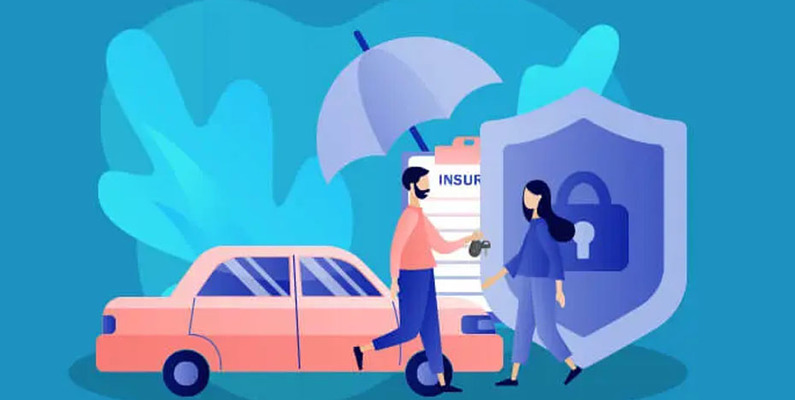 

# **Vehicle Damage Insurance Verification**  

### **Problem Statement:**

In the insurance industry, processing claims for vehicle damage is a common and most essential task. With the advancement in **AI** and **Computer Vision**, the users can settle the claims online instantly by uploading the images of the damaged car with the insurance company.

Now, insurance companies face the constant challenge of identifying fraudulent claims. It's a common practice for the users to submit the fraudulent images as a part of the claim settlement process. This brings out the threat/challenge to the insurance companies to identify the fraudulent claims which leads to significant financial losses.

Fraudulent claims often involve exaggerating the extent of damage or submitting false claims altogether. In this problem, we will focus on the first type of problem i.e. exaggerating the extent of damage. To mitigate these losses and maintain the integrity of their operations, insurance companies must develop effective methods to flag out these claims most accurately and efficiently.

The hackathon challenges you to develop a robust and high performance model for classifying an image of a car into different types of damages automatically with the help of computer vision techniques. By accurately identifying the damages, the insurance company can assess the legitimacy of the claim and make informed decisions regarding payouts.

Type of the damage present in the car:

1: `crack`;<p> 
2: `scratch`;<p>
3: `tire flat`;<p>
4: `dent`;<p>
5: `glass shatter`;<p>
6: `lamp broken`<p>

### **1 - Exploring the Dataset:**<p>

Let's start by importing the libraries necessary for analyzing and building the neural network model:

In [1]:
# Data modeling and manipulation:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split, Dataset
import torchvision
from torchvision import datasets, transforms as torchvision_transforms
import numpy as np
import pandas as pd
from collections import Counter
import shutil
import random

C:\Users\eduar\AppData\Roaming\Python\Python311\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Assessment and Metrics:
from sklearn.metrics import f1_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

In [3]:
#Image Manipulation and Transformation:
import os
import cv2
import albumentations as A
from albumentations.pytorch import ToTensorV2
from PIL import Image
from torchvision.utils import make_grid

In [4]:
#Data Visualization:
import matplotlib.pyplot as plt
import seaborn as sns

For this challenge, we received the dataset in two folders: `train_folder` and `test_folder`. The `test_folder` contains a set of images without labels, which prevents their use for testing after model training. Therefore, we will use the images from `test_folder` as a validation set and create the test set by dividing the `train_folder`.

Before building our dataset, let's check the distributions of image dimensions in this dataset:

In [5]:
def analyze_image_dimensions(dataset_path):

    ''' 
    The function analyzes the dimensions (width and height) of images in a dataset and provides statistics on 
    these dimensions.
    
    It also generates histograms to visualize the distribution of image widths and heights.

    Args:
    dataset_path: The path to the dataset containing the images to be analyzed.
    
    Return:
    width_stats: A dictionary contains statistics about image widths, including the mean, median, minimum,
    maximum, and standard deviation.

    height_stats: A dictionary containing statistics about image heights, including the mean, median, minimum,
    maximum and standard deviation.
    '''
    
    # Load the dataset without transformations
    dataset = datasets.ImageFolder(root=dataset_path)

    # Extract image file paths
    image_paths = [img[0] for img in dataset.imgs]

    # Initialize lists to store widths and heights
    widths = []
    heights = []

    # Collect width and height information for all images
    for path in image_paths:
        with Image.open(path) as img:
            width, height = img.size
            widths.append(width)
            heights.append(height)

    # Calculate statistical metrics
    width_stats = {
        "mean": np.mean(widths),
        "median": np.median(widths),
        "min": np.min(widths),
        "max": np.max(widths),
        "std": np.std(widths)
    }

    height_stats = {
        "mean": np.mean(heights),
        "median": np.median(heights),
        "min": np.min(heights),
        "max": np.max(heights),
        "std": np.std(heights)
    }

    # Plot histograms
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    # Plot width histogram
    axs[0].hist(widths, bins=30, color='blue', alpha=0.7)
    axs[0].set_title('Width Distribution')
    axs[0].set_xlabel('Width')
    axs[0].set_ylabel('Frequency')

    # Plot height histogram
    axs[1].hist(heights, bins=30, color='red', alpha=0.7)
    axs[1].set_title('Height Distribution')
    axs[1].set_xlabel('Height')
    axs[1].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()

    return width_stats, height_stats

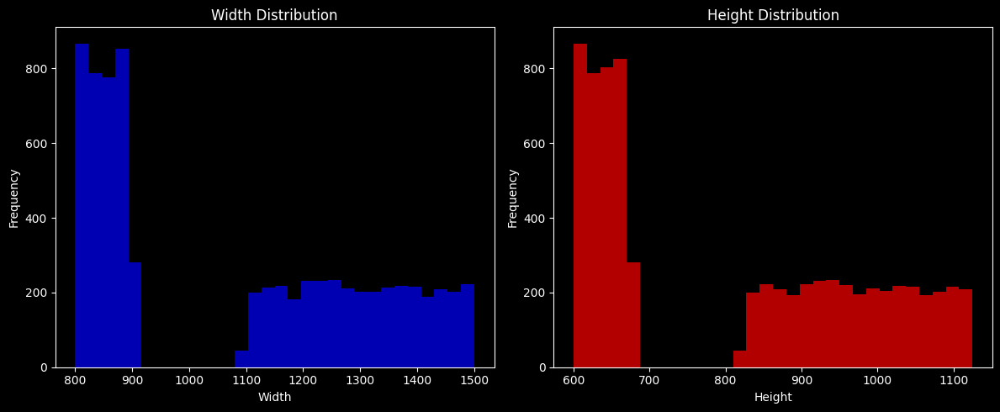

Width statistics: {'mean': 1076.6584722222221, 'median': 1103.0, 'min': 800, 'max': 1500, 'std': 239.66271298987226}
Height statistics: {'mean': 807.1286111111111, 'median': 827.0, 'min': 600, 'max': 1125, 'std': 179.74913417582815}


In [6]:
# Example usage:
dataset_path = os.getenv('DATASET_PATH')
width_stats, height_stats = analyze_image_dimensions(dataset_path)
print("Width statistics:", width_stats)
print("Height statistics:", height_stats)

It is observed that, as expected, the images in this dataset have different sizes, as shown in the spectrum described in the histogram. Considering the context of machine processing, it is important to normalize the dimensions of these images to facilitate the learning of the neural network.

Given that most images have dimensions between 600 ~ 700 pixels in height and 800 ~ 900 pixels in width, we may consider restructuring the dimensions to these values, minimizing distortion in a reduced number of images. However, it is important to consider that images with these dimensions would result in a high-dimensional matrix during neural network training, increasing computational cost and training time, especially in an environment without access to a GPU.

In this situation, we have chosen to resize the images to the common dimension of 224 x 224, often used in image classification training. If difficulties arise during model training in capturing the necessary patterns for classification, we may reconsider resizing the images to alternative dimensions to optimize learning performance.

Let's build our data transformation pipeline:

In [7]:
# Image transformation
transform_pipeline = torchvision_transforms.Compose([torchvision_transforms.Resize((224, 224)),
                                                     torchvision_transforms.ToTensor()])

# Load the datasets
dataset = datasets.ImageFolder(root=os.getenv('DATASET_PATH'), transform=transform_pipeline)

# DataLoader for datasets
dataset_loader = DataLoader(dataset, batch_size=32, shuffle=True)

Let's check some images from the training dataset, after normalizing the dimensions:

In [8]:
# Function to show a batch of images
def imshow(img, figsize=(20, 10)):
    img = img / 2 + 0.5  
    npimg = img.numpy()
    plt.figure(figsize=figsize)
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.axis('off')
    plt.show()

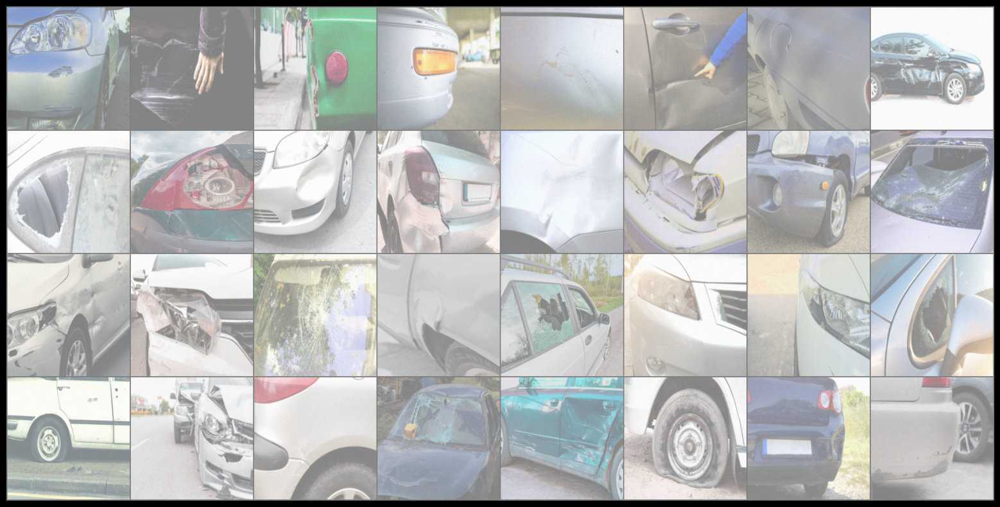

In [9]:
# Get a batch of training
dataiter = iter(dataset_loader)
images, labels = next(dataiter)

# Show images
imshow(torchvision.utils.make_grid(images))

The white image may be caused by changes in figure sizes. To address this issue, we'll ensure that the image is properly denormalized and adjust `torchvision.utils.make_grid` to display images correctly. To accomplish this, let's begin by conducting a static analysis of these images.<p>
We will conduct an analysis of key image statistics, encompassing the computation of fundamental metrics such as the mean and standard deviation of pixel values. This step is pivotal in the normalization procedure. Consequently, we advocate for the development of a dedicated function to compute these parameters.

In [10]:
def get_mean_std(loader):
    ''' 
    This function, get_mean_std(loader), is designed to calculate the mean and 
    standard deviation of image pixel values ​​in a PyTorch DataLoader.

    Args: loader - A PyTorch DataLoader that contains image data.

    Return: Returns the mean and standard deviation of image pixel values ​​across the entire dataset.
    '''
    mean = 0.
    std = 0.
    total_images_count = 0
    
    for images, _ in loader:
        # Add the number of processed images
        total_images_count += images.size(0)
        
        # Format images to [batch_size, num channels, height * width]
        images = images.view(images.size(0), images.size(1), -1)
        
        # Calculate the average and add to the total
        mean += images.mean(2).sum(0)
        
        # Calcule o desvio padrão e adicione ao total
        std += images.std(2).sum(0)
    
    # Divide by the total number of images
    mean /= total_images_count
    std /= total_images_count

    return mean, std

In [11]:
# Assuming train_loader is a valid DataLoader with the loaded dataset
mean, std = get_mean_std(dataset_loader)
print(f'Mean: {mean}')
print(f'Std: {std}')

Mean: tensor([0.4777, 0.4597, 0.4605])
Std: tensor([0.2204, 0.2193, 0.2211])


Utilizing the output from the `get_mean_std` function, we can update the `transform_pipeline` to enhance the image quality, considering the newly adopted dimensions.

In [12]:
# Image transformation
transform_pipeline_standardized = torchvision_transforms.Compose([
    torchvision_transforms.Resize((224, 224)),
    torchvision_transforms.ToTensor(),
    torchvision_transforms.Normalize(mean=[0.48, 0.46, 0.46], std=[0.5, 0.5, 0.5])])

# Load the datasets
dataset_standardized = datasets.ImageFolder(root=os.getenv('DATASET_PATH'),transform=transform_pipeline_standardized)

# DataLoader for datasets
dataset_loader_standardized = DataLoader(dataset_standardized, batch_size=32, shuffle=True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


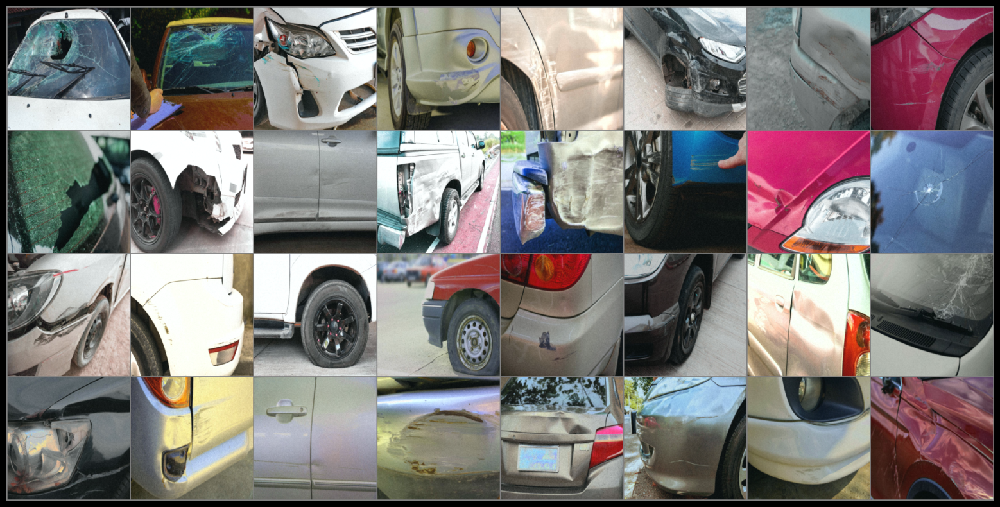

In [13]:
# Obter um lote de treinamento
dataiter = iter(dataset_loader_standardized)
images, labels = next(dataiter)
# Mostrar as imagens
imshow(torchvision.utils.make_grid(images))

Please note that while the standard deviation result was approximately 0.22, a value of 0.5 is being employed. This choice, made experimentally, has significantly enhanced the image quality.

### **2 – Splitting the Dataset into Training and Testing Sets:**<p>

Along with the folders where the images that make up the dataset are located, a CSV file was received with the labels for each image in the `train_folder` folder. This file will be used as a reference so that we can build the neural network training and validation dataset.

In [14]:
data=pd.read_csv(os.getenv('LABEL_PATH'))

# Defina o mapeamento das labels
label_mapping = { 1: 'crack', 2: 'scratch', 3: 'tire flat', 4: 'dent', 5: 'glass shatter', 6: 'lamp broken'}

# Adicionar uma coluna com a descrição do label correspondente
data['label_description'] = data['label'].map(label_mapping)

# Verificar o resultado
data.head()

,image_id,filename,label,label_description
0,1,1.jpg,2,scratch
1,2,2.jpg,4,dent
2,3,3.jpg,2,scratch
3,4,4.jpg,3,tire flat
4,5,5.jpg,5,glass shatter


Let's split our dataset into a training and testing set

In [15]:
data_train, data_val = train_test_split(data, test_size=0.2, random_state=42, stratify=data['label'])

Lets check the data distribution in the data_train and data_val:

In [16]:
def plot_label_distribution(data, label_mapping, title_suffix):

    '''  
    This function plots bar and pie charts to show the distribution of labels in a data set.
    It is useful for viewing the quantity and proportion of samples per label.

    Args:
    data (DataFrame): DataFrame containing the label column that has the sample labels.
    label_mapping (dict): Dictionary that maps labels (numbers) to their respective descriptions (names).
    title_suffix (str): String that will be added to chart titles to indicate the source of the data 
    (for example, "Training" or "Validation").
    
    Return:
    The function does not return any value. It just generates and displays the graphs.
    '''

    # Count the number of samples per label
    label_description_count = data['label'].value_counts()

    # Get values ​​and indices
    label_description_values = label_description_count.values
    label_description_index = label_description_count.index

    # Map labels to descriptions
    label_names = [label_mapping[idx] for idx in label_description_index]

   # Plot the graphs
    plt.figure(figsize=(15, 6))

   # Bar chart
    plt.subplot(1, 2, 1)
    bars = plt.bar(label_description_index, label_description_values)
    plt.title(f'Quantity per Samples ({title_suffix})')
    plt.xlabel('Labels')
    plt.ylabel('Count')

    # Add values ​​to the top of each bar
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2.0, yval, f'{yval}', va='bottom', ha='center')

    # Pie Chart
    plt.subplot(1, 2, 2)
    plt.pie(label_description_values, labels=label_names, autopct='%1.1f%%', startangle=140, colors=plt.cm.tab20.colors)
    plt.title(f'Proportion by Samples ({title_suffix})')

    plt.tight_layout()
    plt.show()


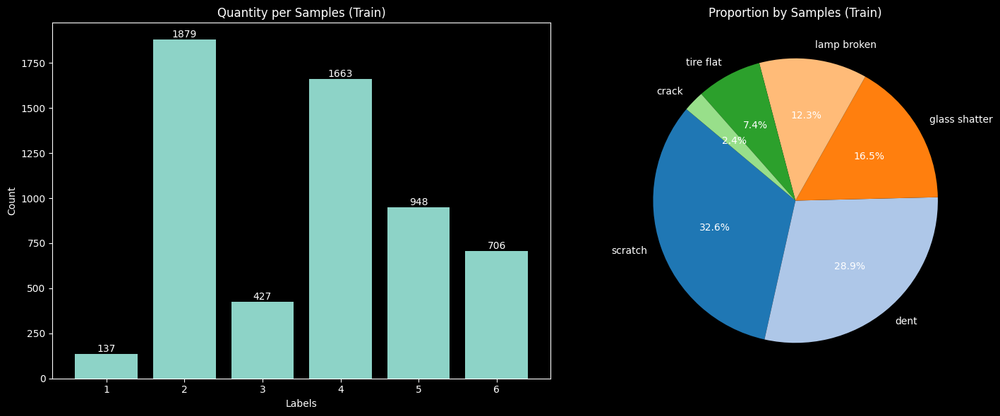

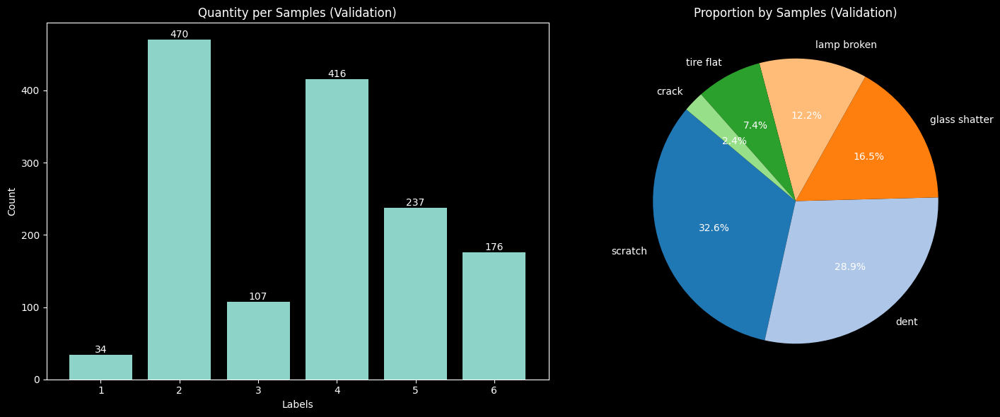

In [17]:
# Label mapping dictionary
label_mapping = {1: 'crack', 2: 'scratch', 3: 'tire flat', 4: 'dent', 5: 'glass shatter', 6: 'lamp broken'}

# Generate graphs for training data
plot_label_distribution(data_train, label_mapping, "Train")

# Generate graphs for validation data
plot_label_distribution(data_val, label_mapping, "Validation")

As seen in the figures above, the data set presents an imbalance between the classes, which can harm the learning of the neural network when predicting classes with a smaller number of samples. During data division, care was taken to maintain the same proportion of unbalance between the different subsets. This way, it is possible to apply the `class weight` technique to mitigate this problem.

Basically, the class weight technique is used to deal with class imbalance in data sets. This technique assigns greater weight to minority classes, helping the model pay more attention to these classes during training.

Consider a dataset with $N$ samples and $C$ classes. Let $n_{i}$​ represent the number of samples of class $i$. The class weight 
$w_i$ for class $i$ can be computed as:<p>

$$
w_i = \frac{N}{C \cdot n_i}
$$

Applying this formulation to the dataset:

In [18]:
# Count the frequency of each class
label_counts = Counter(data_train['label'])
total_count = sum(label_counts.values())

# Calculate inverse weights
class_weights = {label: total_count/count for label, count in label_counts.items()}
weights = torch.tensor([class_weights[i] for i in sorted(class_weights.keys())], dtype=torch.float32)

# Display the calculated weights
print("Class Weights:", weights)

Class Weights: tensor([42.0438,  3.0655, 13.4895,  3.4636,  6.0759,  8.1586])


Now that we have the training and validation datasets formulated, let's reorganize the images into separate folders according to their respective labels. This organization will facilitate the preparation of the dataset and dataloader that will be used to train the neural network.

In [19]:
# Changing the data type of the label column:
data_train['label'] = data_train['label'].astype(str)

# Iterate over each line of the dataframe
for idx, row in data_train.iterrows():
    filename = row["filename"]
    label_class = row["label"]
    image_path = os.getenv('SOURCE_IMAGE_PATH')+ filename
    dest_dir = os.path.join(os.getenv('TRAIN_FOLDER_PATH'), label_class)

   # Create the class folder if it doesn't already exist
    if not os.path.exists(dest_dir):
        os.makedirs(dest_dir)

    # Copy the image to the folder corresponding to the classe
    shutil.copy2(image_path, dest_dir)

In [20]:
# Changing the data type of the label column:
data_val['label'] = data_val['label'].astype(str)

# Iterate over each row in the dataframe
for idx, row in data_val.iterrows():
    filename = row["filename"]
    label_class = row["label"]
    image_path = os.getenv('SOURCE_IMAGE_PATH') + filename
    dest_dir = os.path.join(os.getenv('VALIDATION_FOLDER_PATH'), label_class)

    # Create the class folder if it doesn't already exist
    if not os.path.exists(dest_dir):
        os.makedirs(dest_dir)

    # Copy the image to the folder corresponding to the class
    shutil.copy2(image_path, dest_dir)

After moving the images to their respective folders, we will check whether the proportions of images in the folders match those previously defined in the dataset. To do this, we will use the following function:

In [21]:
def count_images_in_folders(root_dir):

    '''
    The count_images_in_folders function counts the number of image files in each subdirectory of a specified 
    root directory.
    Each subdirectory represents a class, and the function returns a dictionary with the name of the classes and the 
    number of images in each class.

    Args:
    root_dir (str): The path to the root directory where the classes' subdirectories are located. 
    Each subdirectory must contain images belonging to a specific class.

    Return:
    class_counts (dict): A dictionary where the keys are the class names (subdirectory names) and the
    values ​​are the number of images in each class.
    '''

    class_counts = {}
    
   # Iterate over each subdirectory in root_dir
    for class_name in os.listdir(root_dir):
        class_dir = os.path.join(root_dir, class_name)
        
       # Check if the subdirectory is actually a directory
        if os.path.isdir(class_dir):
            # Count the image files in the class directory
            num_images = len(os.listdir(class_dir))
            class_counts[class_name] = num_images
    
    return class_counts

# Root directory where the datasets are located
root_train_dir = os.getenv('TRAIN_FOLDER_PATH')
root_val_dir = os.getenv('VALIDATION_FOLDER_PATH')

# Count images in training and test datasetse
train_image_counts = count_images_in_folders(root_train_dir)
val_image_counts = count_images_in_folders(root_val_dir)

# Print the results
print("Number of images in each class in the training dataset:")
for class_name, count in train_image_counts.items():
    print(f"Class {class_name}: {count} images")

print("\nNumber of images in each class in the test dataset:")
for class_name, count in val_image_counts.items():
    print(f"Class {class_name}: {count} images")


Number of images in each class in the training dataset:
Class 1: 137 images
Class 2: 1879 images
Class 3: 427 images
Class 4: 1663 images
Class 5: 948 images
Class 6: 706 images

Number of images in each class in the test dataset:
Class 1: 34 images
Class 2: 470 images
Class 3: 107 images
Class 4: 416 images
Class 5: 237 images
Class 6: 176 images


### **3 – Definition of the Dataset and Verification Functions:**<p>

Now that the images are properly treated and organized into folders, let's create the dataset for training the neural network:

In [22]:
# Classe personalizada para o Dataset
class CustomDataset(Dataset):

    ''' 
    The CustomDataset class is a custom class that inherits from PyTorch's Dataset class. It is used to load 
    and pre-processdata from an image dataset for use in training convolutional neural network (CNN) models.

    __init__:

    Description: This method is called when a new instance of the CustomDataset class is created. It initializes the 
    class attributes.

    Args:
    dataframe (DataFrame): The dataframe containing the data information, such as image paths and labels.
    root_dir (str): The root directory where the images are stored.
    transform (callable, optional): A transformer object that will be applied to the samples. This object can be a sequence
    of transformations provided by the torchvision.transforms library. If not provided, no transformation will be applied 
    and images will be loaded in their original form.

    __len__:

    Description: This method returns the total size of the dataset, that is, the number of samples in the dataframe.
    Args: Does not receive additional arguments.
    How it works: The method returns the length of the dataframe, which is equivalent to the number of samples in 
    the dataset.

    __getitem__:

    Description: This method is responsible for returning a sample of the dataset when provided with an index.
    
    Args:
    idx (int): The index of the sample you want to retrieve.
    '''
    def __init__(self, dataframe, root_dir, transform=None):
        self.dataframe = dataframe
        self.root_dir = root_dir
        self.transform = transform

        # Mapear os rótulos para índices de 0 a N-1
        self.label_mapping = {label: idx for idx, label in enumerate(sorted(dataframe['label'].unique()))}

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_name = os.path.join(self.root_dir, str(self.dataframe.iloc[idx, 2]), self.dataframe.iloc[idx, 1])
        image = Image.open(img_name).convert('RGB')
        label = self.label_mapping[self.dataframe.iloc[idx, 2]]  # Obter o índice do rótulo mapeado

        if self.transform:
            image = self.transform(image=np.array(image))['image']

        return image, label

After constructing the dataset intended for model training, the transformation pipelines for the training and validation datasets will be configured, including Data augmentation techniques specific to the training set:

In [23]:
# Transformations for training and validation
train_transform = A.Compose([A.HorizontalFlip(), A.ShiftScaleRotate(rotate_limit=5, value=0, border_mode=cv2.BORDER_REFLECT),
    A.OneOf([A.CLAHE(), A.RandomBrightnessContrast(), A.HueSaturationValue()], p=1), A.Normalize(mean=[0.48, 0.46, 0.46],
    std=[0.5, 0.5, 0.5]),A.Resize(224, 224), ToTensorV2()])

val_transform = A.Compose([ A.Normalize(mean=[0.48, 0.46, 0.46], std=[0.5, 0.5, 0.5]), A.Resize(224, 224), ToTensorV2()])

After defining the transformation pipeline, before passing the data to the model, let's check the dataset was created together with the dataloader.

In [24]:
# Functions to check the dataset and dataloader
def check_dataset(dataset, num_samples=5):
    ''' 
    This function is responsible for viewing a sample of the provided dataset. It displays multiple images from the dataset
    along with their corresponding labels.

    Args:
    dataset (Dataset): The data set to be visualized.
    num_samples (int, optional): The number of samples to view. The default is 5.

    Return:
    This function returns nothing. It only displays the images and labels from the dataset.
    '''

    fig, axs = plt.subplots(1, num_samples, figsize=(15, 15))  
    for i in range(num_samples):
        sample = dataset[i]
        image, label = sample[0], sample[1]
        axs[i].imshow(image.permute(1, 2, 0))  
        axs[i].set_title(f'Label: {label}')
        axs[i].axis('off')  
    plt.show()

def check_dataloader(dataloader, num_batches=1):
    ''' 
    The check_dataloader function is responsible for viewing one or more batches of a provided dataloader.
    It displays the images contained in the batches along with their corresponding labels.

    Args:
    dataloader (DataLoader): The dataloader that contains the batches to be viewed.
    num_batches (int, optional): The number of batches to view. The default is 1.  

    Return:
    This function returns nothing. It only displays batch images and labels.  
    '''
    for i, batch in enumerate(dataloader):
        if i >= num_batches:
            break
        images, labels = batch[0], batch[1]
        grid_img = make_grid(images, nrow=8)   
        plt.imshow(grid_img.permute(1, 2, 0)) 
        plt.show()
        print(f'Batch {i+1} - Labels: {labels}')

In [25]:
train_img_dir = os.getenv('TRAIN_FOLDER_PATH')
test_img_dir = os.getenv('VALIDATION_FOLDER_PATH')

train_dataset_final = CustomDataset(dataframe=data_train, root_dir=train_img_dir, transform=train_transform)
val_dataset_final = CustomDataset(dataframe=data_val, root_dir=test_img_dir, transform=val_transform)

batch_size = 16
train_loader_final = DataLoader(train_dataset_final, batch_size=batch_size, shuffle=True)
val_loader_final = DataLoader(val_dataset_final, batch_size=batch_size, shuffle=False)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Checking train_dataset...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


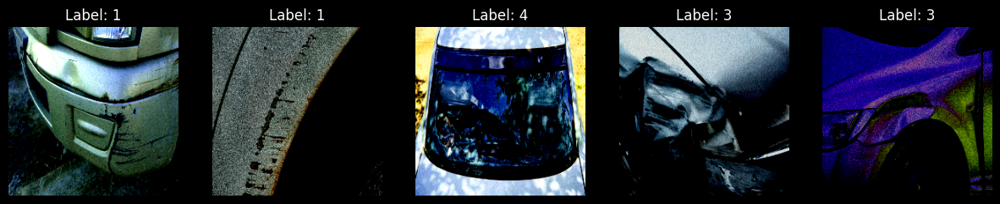

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Checking val_dataset...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


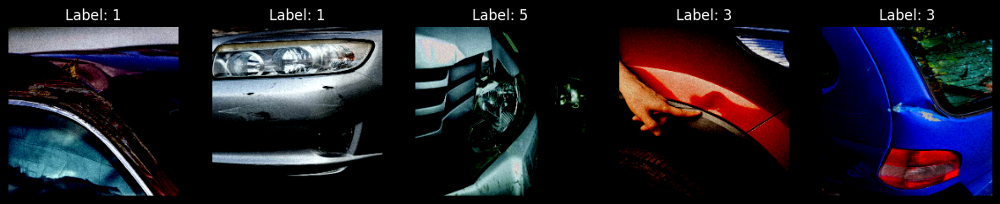

Checking train_loader...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


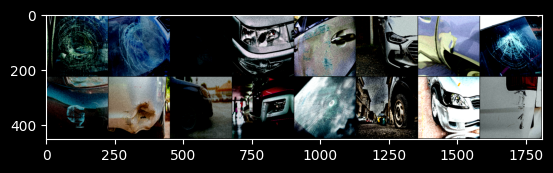

Batch 1 - Labels: tensor([4, 4, 4, 5, 3, 3, 3, 4, 1, 3, 2, 1, 4, 2, 5, 1])
Checking val_loader...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


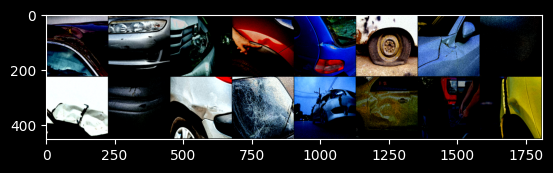

Batch 1 - Labels: tensor([1, 1, 5, 3, 3, 2, 3, 1, 3, 1, 3, 4, 1, 3, 5, 3])


In [26]:
# Check training dataset
print("Checking train_dataset...")
check_dataset(train_dataset_final)

# Check dataset validation
print("Checking val_dataset...")
check_dataset(val_dataset_final)

# Check training data loader
print("Checking train_loader...")
check_dataloader(train_loader_final)

# Check validation dataloader
print("Checking val_loader...")
check_dataloader(val_loader_final)

### **4 – Defining the Architecture of the Neural Network:**<p>

To illustrate the neural network that will be used, consider the following representation:

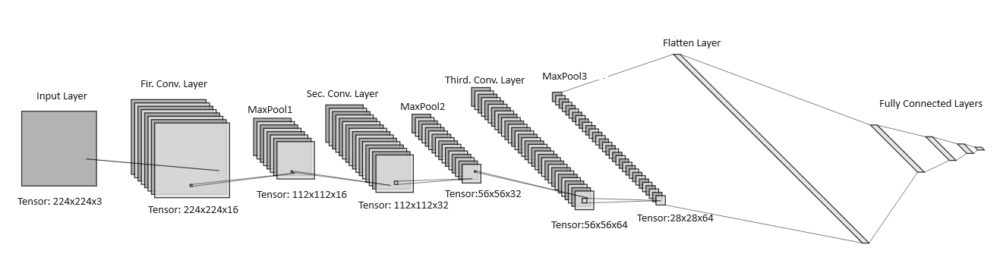

In the architecture illustrated above, the input tensor is derived from RGB images with dimension 224x224x3. Next, `convolutional` layers are applied with the aim of extracting features from different abstraction levels of the input image. The first layers capture simple edges and textures, while deeper layers identify more complex and abstract patterns.<p>

`Pooling layers` reduce the spatial dimensions of feature maps, reducing the number of parameters and computational cost, as well as providing a form of invariance to small translations. The flatten layer transforms the three-dimensional tensor into a one-dimensional vector, preparing it to be processed by the `fully connected layers`.<p>

The `fully connected` layers combine and refine the features extracted by the `convolutional` layers to perform the final classification.<p>

In addition to these layers, `batch normalization layers` are being used after each convolutional layer to improve the performance of the neural network. In the `fully connected` layers, dropout is applied, a technique recommended in deep learning models to reduce the risk of overfitting by randomly disconnecting a fraction of the neurons during training.<p>

Below you can see the implementation of this neural network using Pytorch:

In [27]:
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        # Same padding --> input_size=output_size
        # Same padding = (filter_size-1)/2 -->(3-1)/2 = 1
        self.first_covolutional_layer = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, padding=1, stride=1)
        # The ouput size of each of the 16 features maps:
        #[(input_size-filter_size + 2(padding))/stride + 1] = (224 - 3 + 2)/1 + 1 = 224
        self.batchnorm1 = nn.BatchNorm2d(16)
        self.relu=nn.ReLU()
        self.maxpool = nn.MaxPool2d(kernel_size=2)
        #The output size = 224/2  = 112
        # Same padding = (filter_size-1)/2 -->(5-1)/2 = 2
        self.second_covolutional_layer = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=5, padding=2, stride=1)
        #[(input_size-filter_size + 2(padding))/stride + 1] = (112 - 5 + 4)/1 + 1 = 112
        self.batchnorm2 = nn.BatchNorm2d(32)
        self.third_covolutional_layer = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=7, padding=3, stride=1)
        #The output size = 112/2  = 56
        # Same padding = (filter_size-1)/2 -->(7-1)/2 = 3
        #[(input_size-filter_size + 2(padding))/stride + 1] = (56 - 7 + 6)/1 + 1 = 56
        self.batchnorm3 = nn.BatchNorm2d(64)
        # Ajuste aqui para refletir a dimensão correta
        #The output size = 56/2 = 28
        self.first_full_conective_layer = nn.Linear(64 * 28 * 28, 1024)
        self.dropout = nn.Dropout(p=0.3)
        self.second_full_conective_layer  = nn.Linear(1024, 512)
        self.third_full_conective_layer  = nn.Linear(512,200)
        self.fourth_full_conective_layer = nn.Linear(200,6)
        

    def forward(self, input_data):
        out=self.first_covolutional_layer(input_data)
        out=self.batchnorm1(out)
        out=self.relu(out)
        out=self.maxpool(out)
        out=self.second_covolutional_layer(out)
        out=self.batchnorm2(out)
        out=self.relu(out)
        out=self.maxpool(out)
        out=self.third_covolutional_layer(out)
        out=self.batchnorm3(out)
        out=self.relu(out)
        out=self.maxpool(out)
        
        # Flatten the 64 features maps from to Max Pool to feed it to the FC1 (50176, 1024)
        out=torch.flatten(out,1)
        out=self.first_full_conective_layer(out)
        out=self.relu(out)
        out=self.dropout(out)
        out=self.second_full_conective_layer(out)
        out=self.relu(out)
        out=self.dropout(out)
        out=self.third_full_conective_layer(out)
        out=self.relu(out)
        out=self.dropout(out)
        out=self.fourth_full_conective_layer(out)
        return out 


Given the complexity of the presented model and the difficulty of finding the global minimum to minimize the loss function and maximize learning, a dynamic learning rate will be used during training. This will help improve model convergence. To implement this technique, a custom class called `CustomLRScheduler` will be created.<p>

The `CustomLRScheduler` class is designed to dynamically adjust the learning rate of the optimizer based on the model's performance during training. Here is a detailed explanation of each part of the class.

In [28]:
class CustomLRScheduler:
    ''' 
    optimizer: The optimizer whose learning rates will be adjusted.
    init_lr: An initial learning rate.
    factor: The factor by which the learning rate will be multiplied for increases and decreases.
    patience: The number of epochs without improvement after the learning rate is adjusted.
    cooldown: The number of epochs to wait after adjusting the learning rate before considering further adjustments.
    min_lr: The minimum allowed learning rate.
    mode: The adjustment mode, which can be 'min' to minimize the metric (such as loss) or 'max' to maximize the metric
    (such as accuracy)
    '''
    def __init__(self, optimizer, init_lr, factor, patience, cooldown, min_lr, mode):
        self.optimizer = optimizer
        self.init_lr = init_lr
        self.factor = factor
        self.patience = patience
        self.cooldown = cooldown
        self.min_lr = min_lr
        self.mode = mode
        self.best = None
        self.num_bad_epochs = 0
        self.cooldown_counter = 0

    def step(self, metric):
        '''
        metric: The metric to be monitored (for example, loss or accuracy).
        is_better: Determines whether the current metric is better than the best metric observed so far.
        If the metric has improved, the learning rate is increased (if possible).
        If the metric has not improved and the cooldown is not active, the learning rate is decreased after
        a specific number of consecutive bad epochs.
        '''
        if self.mode == 'min':
            is_better = metric < self.best if self.best is not None else True
        else:
            is_better = metric > self.best if self.best is not None else True

        if is_better:
            self.best = metric
            self.num_bad_epochs = 0
            self._increase_lr()
        else:
            if self.cooldown_counter > 0:
                self.cooldown_counter -= 1
                self.num_bad_epochs = 0
            elif self.num_bad_epochs >= self.patience:
                self._decrease_lr()
                self.cooldown_counter = self.cooldown
                self.num_bad_epochs = 0
            else:
                self.num_bad_epochs += 1

    def _increase_lr(self):
        '''
        This method increases the learning rate by multiplying it by the inverse of the
        factor, up to a maximum of the initial learning rate.
        '''
        for param_group in self.optimizer.param_groups:
            new_lr = min(param_group['lr'] / self.factor, self.init_lr)
            param_group['lr'] = new_lr

    def _decrease_lr(self):
        '''
        This method decreases the learning rate by multiplying it by the factor, up to a minimum of the minimum allowed 
        learning rate.
        '''
        for param_group in self.optimizer.param_groups:
            new_lr = max(param_group['lr'] * self.factor, self.min_lr)
            param_group['lr'] = new_lr

In [29]:
model=CNN()

CUDA=torch.cuda.is_available()
if CUDA:
    model=model.cuda()

loss_fn=nn.CrossEntropyLoss(weight=weights)
optimizer=torch.optim.Adam(model.parameters(),lr=1e-4, weight_decay=1e-4)  
scheduler = CustomLRScheduler(optimizer, init_lr=1e-4, factor=0.1, patience=7, cooldown=5, min_lr=1e-8, mode='min')

### **Adam Optimizer:**<p>
We do not give details about Adam Optimizer technique because it has an extensive theory, but Adam (Adaptive Moment Estimation) is a popular optimization algorithm used in training neural networks. It combines techniques from RMSprop (Root Mean Square Propagation) and momentum optimization.<p>


### **Loss Function:**<p>

For classification tasks, the most commonly selected loss function is the `Cross Entropy Loss`, this function combines two operations in one: applying the `softmax` function to the model predictions and calculating the cross entropy between the normalized predictions ( softmax) and the true labels.<p>

This function is defined as:<p>

$$
L = -\frac{1}{N} \sum_{i=1}^{N} \sum_{j=1}^{C} y_{ij} \log(p_{ij})
$$

- $L$ is the total loss.
- $N$ is the number of samples.
- $C$ is the number of classes.
- $y_{ij}$ ​ is the binary value that indicates whether sample $i$ belongs to class $j$ (1 if true, 0 if false).
- $p_{ij}$​ is the probability predicted by the model that sample $i$ belongs to class $j$, after applying the softmax function.

**Softmax function**<p>

The softmax function is used to convert model outputs (logits) into probabilities. For an output $z$ of the model with $C$ classes, the softmax function is defined as:<p>

$$
p_j = \frac{e^{z_j}}{\sum_{k=1}^{C} e^{z_k}}
$$

- $p_j$ is the predicted probability for class $j$.
- $z_j$ is the logit (linear model output) for class $j$.
- $C$ is the number of classes.

In PyTorch, `CrossEntropyLoss` combines the `softmax` function and cross entropy loss into a single operation to improve computational efficiency. The use of weights is optional, in this case it is useful because of the unbalanced classes to give more importance to less frequent classes, as we have already computed the weight values, we pass these values ​​as parameters to the loss function (`loss_fn`)<p>

### **Regularization with L2 (Weight Decay)**<p>

Regularization is a technique used to prevent overfitting by adding a penalty to the loss function for large weights. In the context of neural networks, L2 regularization (also known as weight decay) is a commonly used method. It works by adding the squared magnitude of all weights to the loss function, which helps to keep the weights small and the model simpler.

The regularized loss function with L2 regularization is defined as:

$$
L_{reg}= L +\lambda \sum_{k} \theta^{2}_{k}
$$

- $L_{reg}$​ is the regularized loss.
- $L$ is the original loss (cross entropy loss in this case).
- $\lambda$ is the regularization strength (a hyperparameter).
- $\theta_{k}$​ are the weights of the model.

In PyTorch, this regularization is implemented by setting the `weight_decay` parameter in the optimizer. In this case $\lambda=10^{-4}$


In [30]:
# After construction, let's check the dimensions of the model:
print(model.parameters)

<bound method Module.parameters of CNN(
  (first_covolutional_layer): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (batchnorm1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU()
  (maxpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (second_covolutional_layer): Conv2d(16, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (batchnorm2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (third_covolutional_layer): Conv2d(32, 64, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
  (batchnorm3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (first_full_conective_layer): Linear(in_features=50176, out_features=1024, bias=True)
  (dropout): Dropout(p=0.3, inplace=False)
  (second_full_conective_layer): Linear(in_features=1024, out_features=512, bias=True)
  (third_full_conective_layer): Linear(in_features=512, out_f

So, for this model we have a total of `51,972,646 trainable parameters` and `1,854 neurons`.

### **5 – Training the model:**<p>

In [31]:
# Training loop
num_epochs = 60
train_loss = []
train_accuracy = []
train_f1_macro = []
validation_loss = []
validation_accuracy = []
validation_f1_macro = []

for epoch in range(num_epochs):
    correct = 0
    iterations = 0
    iter_loss = 0.0
    train_labels = []
    train_preds = []

    model.train()

    for i, (inputs, labels) in enumerate(train_loader_final):
        if CUDA:
            inputs = inputs.cuda()
            labels = labels.cuda()

        outputs = model(inputs)
        loss = loss_fn(outputs, labels)
        iter_loss += loss.item()

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        _, predicted = torch.max(outputs, 1)
        correct += (predicted == labels).sum().item()
        iterations += 1

        train_labels.extend(labels.cpu().numpy())
        train_preds.extend(predicted.cpu().numpy())

    train_loss.append(iter_loss / iterations)
    train_accuracy.append((100 * correct / len(train_dataset_final)))

    train_labels = np.array(train_labels)
    train_preds = np.array(train_preds)
    train_f1_macro_epoch = f1_score(train_labels, train_preds, average='macro')
    train_f1_macro.append(train_f1_macro_epoch)

    # Testing Phase
    validation_loss_epoch = 0.0
    correct = 0
    iterations = 0
    val_labels = []
    val_preds = []

    model.eval()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(val_loader_final):
            if CUDA:
                inputs = inputs.cuda()
                labels = labels.cuda()

            outputs = model(inputs)
            loss = loss_fn(outputs, labels)
            validation_loss_epoch += loss.item()

            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            iterations += 1

            val_labels.extend(labels.cpu().numpy())
            val_preds.extend(predicted.cpu().numpy())

    validation_loss.append(validation_loss_epoch / iterations)
    validation_accuracy.append((100 * correct) / len(val_dataset_final))

    val_labels = np.array(val_labels)
    val_preds = np.array(val_preds)
    val_f1_macro_epoch = f1_score(val_labels, val_preds, average='macro')
    validation_f1_macro.append(val_f1_macro_epoch)

    # Update scheduler based on validation accuracy
    scheduler.step(validation_loss[-1])

    current_lr = optimizer.param_groups[0]["lr"]
    
    print('''Epoch {}/{}: \nTraining Loss: {:.3f}, Training Accuracy: {:.3f}%, Training F1 Macro: {:.3f},\
          \nTest Loss: {:.3f}, Test Accuracy: {:.3f}%, Test F1 Macro: {:.3f}'''.format(
        epoch+1, num_epochs, train_loss[-1], train_accuracy[-1], train_f1_macro[-1],\
        validation_loss[-1], validation_accuracy[-1], validation_f1_macro[-1]))

Epoch 1/60: 
Training Loss: 1.642, Training Accuracy: 30.677%, Training F1 Macro: 0.273,          
Test Loss: 1.399, Test Accuracy: 45.069%, Test F1 Macro: 0.393
Epoch 2/60: 
Training Loss: 1.386, Training Accuracy: 40.417%, Training F1 Macro: 0.377,          
Test Loss: 1.213, Test Accuracy: 43.472%, Test F1 Macro: 0.423
Epoch 3/60: 
Training Loss: 1.251, Training Accuracy: 43.125%, Training F1 Macro: 0.415,          
Test Loss: 1.158, Test Accuracy: 50.556%, Test F1 Macro: 0.469
Epoch 4/60: 
Training Loss: 1.201, Training Accuracy: 45.035%, Training F1 Macro: 0.441,          
Test Loss: 1.058, Test Accuracy: 49.861%, Test F1 Macro: 0.490
Epoch 5/60: 
Training Loss: 1.112, Training Accuracy: 46.840%, Training F1 Macro: 0.466,          
Test Loss: 1.028, Test Accuracy: 51.667%, Test F1 Macro: 0.507
Epoch 6/60: 
Training Loss: 1.099, Training Accuracy: 48.177%, Training F1 Macro: 0.476,          
Test Loss: 0.973, Test Accuracy: 46.250%, Test F1 Macro: 0.497
Epoch 7/60: 
Training Loss: 

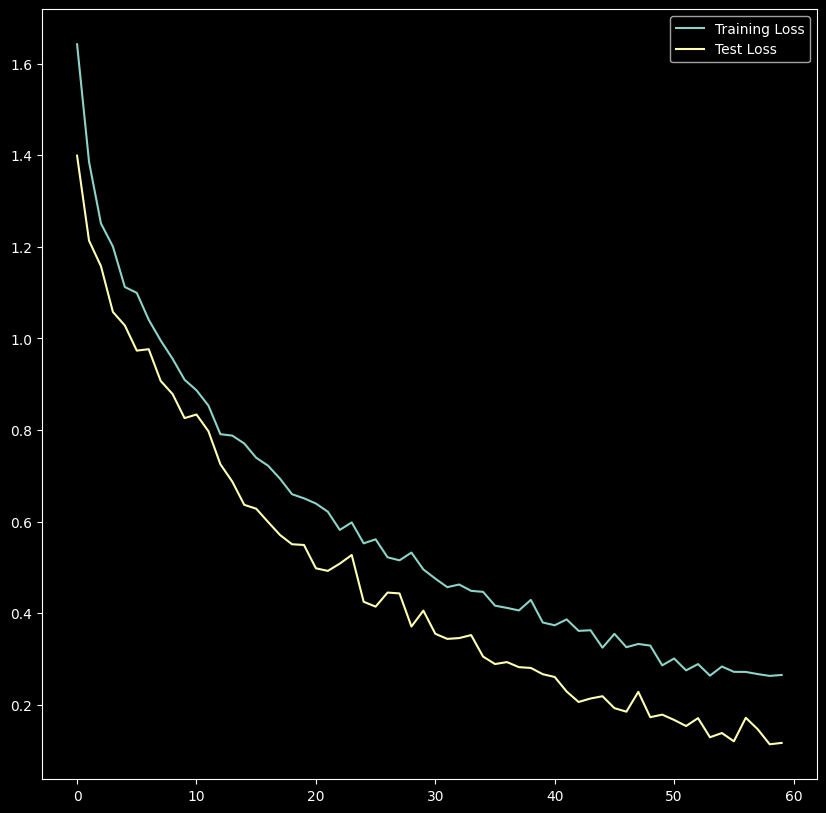

In [32]:
# Plotting the loss:
f=plt.figure(figsize=(10,10))
plt.plot(train_loss, label='Training Loss')
plt.plot(validation_loss, label='Test Loss')
plt.legend()
plt.show()

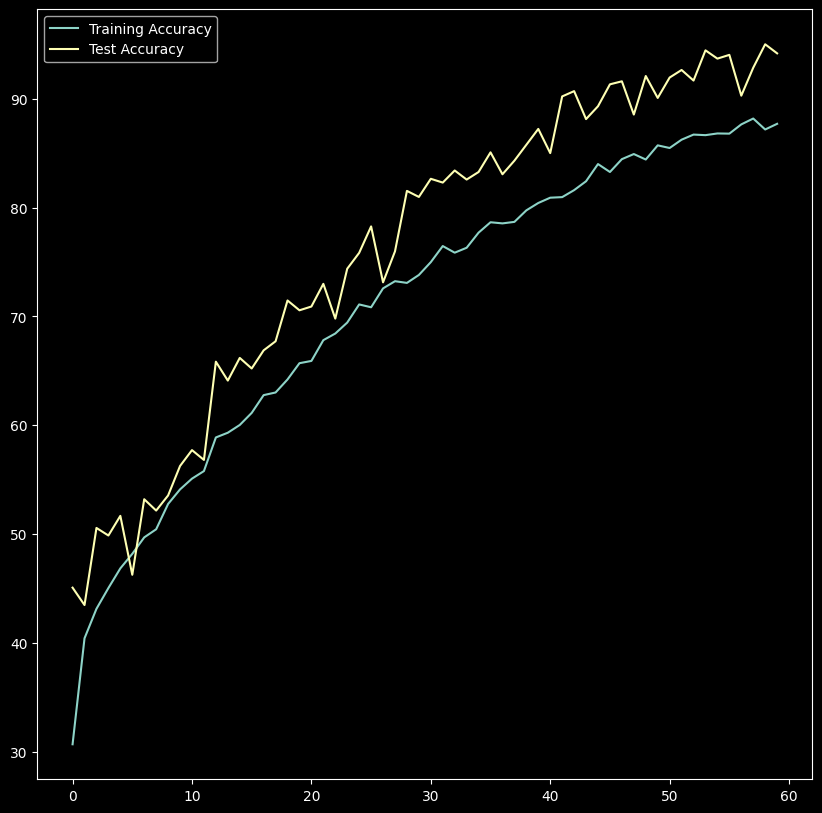

In [33]:
# Plotting the accuracy:
f=plt.figure(figsize=(10,10))
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(validation_accuracy, label='Test Accuracy')
plt.legend()
plt.show()

### **6 – Results:**<p>

Model training lasted around 15 hours, in this next section, performance will be evaluated and new predictions will be made

In [34]:
# Function to plot the confusion matrix with percentage and number of samples
def plot_confusion_matrix(y_true, y_pred, classes, normalize=False, title=None, cmap=plt.cm.Blues):
    if not title:
        title = 'Confusion matrix' if not normalize else 'Normalized confusion matrix'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    # Only use the labels that appear in the data
    unique_labels = np.unique(np.concatenate((y_true, y_pred)))
    classes = [classes[i] for i in unique_labels]

    fig, ax = plt.subplots(figsize=(10, 10))
    sns.heatmap(cm_normalized, annot=False, ax=ax, cmap=cmap, cbar=False, xticklabels=classes, yticklabels=classes)

    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j + 0.5, i + 0.5,
                    f'{cm[i, j]} ({cm_normalized[i, j]:.2%})',
                    ha='center', va='center', color='black')

    ax.set_xlabel('Predicted labels')
    ax.set_ylabel('True labels')
    ax.set_title(title)
    plt.show()


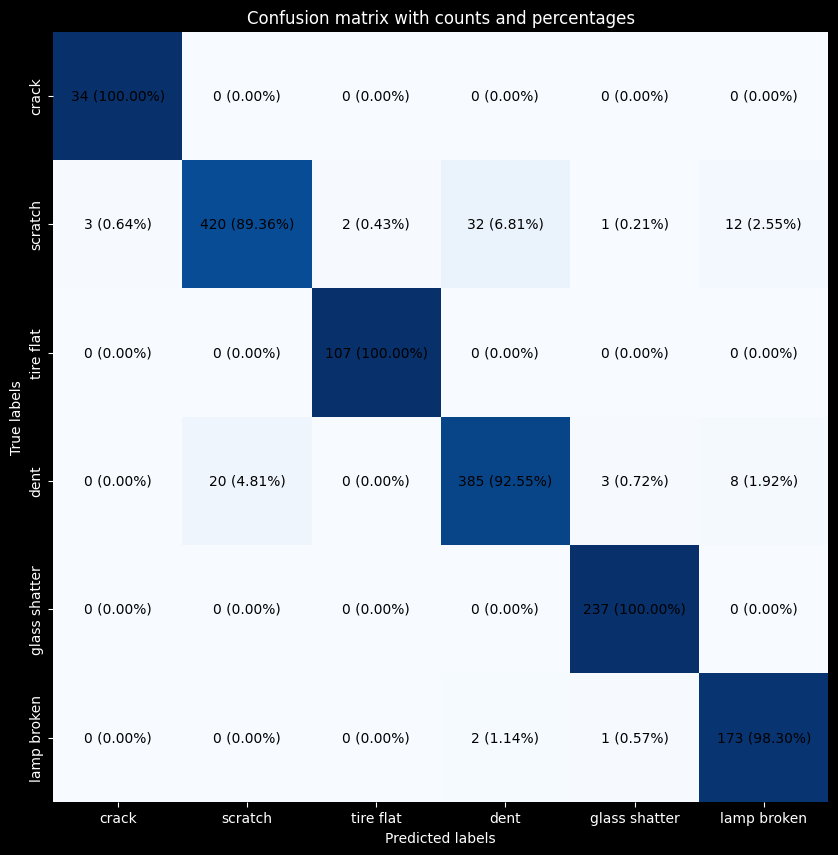

               precision    recall  f1-score   support

        crack       0.92      1.00      0.96        34
      scratch       0.95      0.89      0.92       470
    tire flat       0.98      1.00      0.99       107
         dent       0.92      0.93      0.92       416
glass shatter       0.98      1.00      0.99       237
  lamp broken       0.90      0.98      0.94       176

     accuracy                           0.94      1440
    macro avg       0.94      0.97      0.95      1440
 weighted avg       0.94      0.94      0.94      1440



In [35]:
# Define label mapping
classes = list(label_mapping.values())

# After training, use the labels and predictions collected in the validation set
val_labels = np.array(val_labels)
val_preds = np.array(val_preds)

# Plot confusion matrix
plot_confusion_matrix(val_labels, val_preds, classes=classes, normalize=False, 
                      title='Confusion matrix with counts and percentages')

# Generate rating report
print(classification_report(val_labels, val_preds, target_names=classes))

1-**Crack Class:**<p>
Good recall, indicating that all `crack` cases were correctly identified. Accuracy is also very high, suggesting few false positives. The F1 score reflects a strong balance between precision and recall.

2- **Scratch Class:**<p>
High precision and good recall, with a lower F1 score than good overall performance. The model is very accurate in identifying `scratch` and maintains a good balance, despite there being some false negatives.

3- **Tire Flat Class:**<p>
Almost perfect performance, with high precision and perfect recall. This suggests that the model rarely makes errors for this class.

4- **Dent:**<p>
Excellent precision and recall, indicating very reliable performance for this class.

5- **Glass Shatter:**<p>
Near-perfect precision and recall, suggesting that the model identifies almost all instances of `glass shatter` correctly with very few false positives.

6-**Lamp Broken:**<p>
High precision and excellent recall, suggesting that the model identifies almost all instances of `lamp broken` correctly with few false positives.

### **Performance Assessment:**<p>

1 - **General Performance:**<p>

The model presents excellent precision, recall and F1-score in all classes, with an overall accuracy of 94%. This indicates that the model is doing an excellent job of classifying the instances correctly.<p>

2 - **Best Performing Classes:**<p>
`Tire flat` and `glass shatter` perform almost perfectly, suggesting that the model handles these specific classes very well.<p>

3 - **Classes with Potential for Improvement:**<p> 
The `scratch` class has a slightly lower recall (0.89) compared to other classes, indicating that some instances of `scratch` are not being correctly identified. However, the overall performance is still very good.

4 - **Balance of Metrics:**<p>
The consistency between the macro and weighted metrics indicates that the model maintains a good performance balance between majority and minority classes.

### **Conclusion**<p>
The model demonstrates good and balanced performance, with high precision and recall in almost all classes. The overall accuracy of 94% is a clear indication that the model is robust and reliable. The slight drop in recall for the 'scratch' class may be an area for further investigation, possibly through hyperparameter tuning, more training data, or class balancing techniques. Overall, this is a very well-trained and effective model for the task of classifying the specified defects.


### **7 - Showing Model Prediction Results**<p>
In this section, some prediction results from this model will be presented.

In [36]:
# Function to make predictions with the model trained on multiple images
def predict_and_show_multiple(model, dataset, indices, label_mapping):
    model.eval()  # Put the model in evaluation mode

    fig, axs = plt.subplots(1, 3, figsize=(20, 10)) # Configure a 1x3 grid to display 3 images

    for ax, index in zip(axs.flatten(), indices):
        image, label = dataset[index] # Get the image and the true label of the dataset

        with torch.no_grad():
            if CUDA:
                image = image.cuda()
            output = model(image.unsqueeze(0))  # Add a dimension to the batch

        _, predicted = torch.max(output, 1) # Get the model prediction

        # Show the image
        ax.imshow(image.permute(1, 2, 0).cpu())
        ax.set_title(f'Predicted: {label_mapping[predicted.item() + 1]}, True: {label_mapping[label + 1]}')
        ax.axis('off')

    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


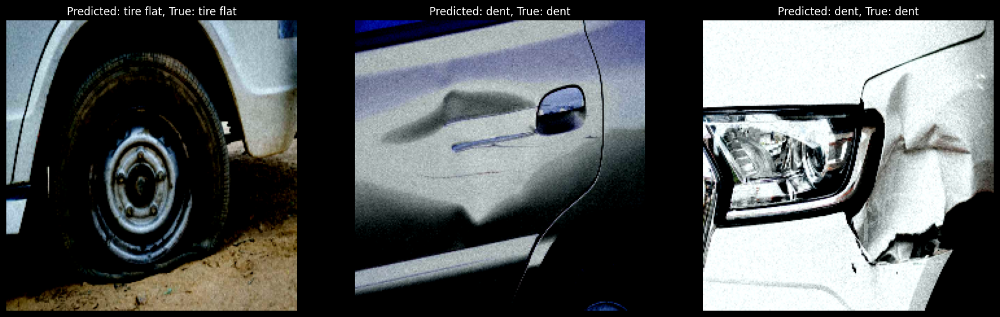

In [158]:
# Select 3 random indices from the validation dataset
total_images = len(val_dataset_final)
random_indices = random.sample(range(total_images), 3)

# Make the prediction and show the images
predict_and_show_multiple(model, val_dataset_final, random_indices, label_mapping)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


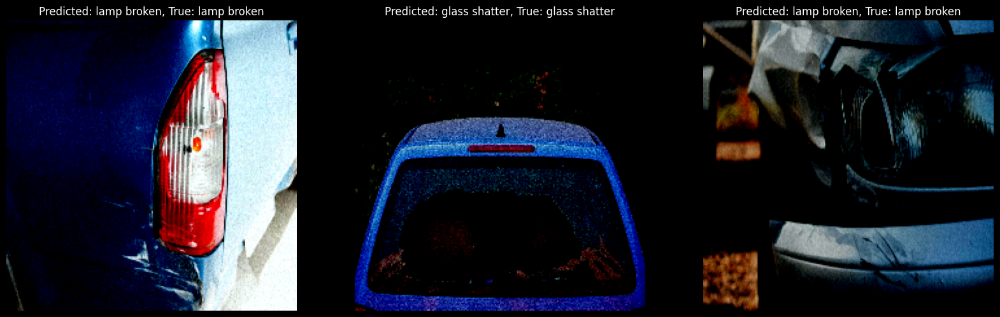

In [284]:
total_images = 1000
random_indices = random.sample(range(total_images), 3)
predict_and_show_multiple(model, val_dataset_final, random_indices, label_mapping)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


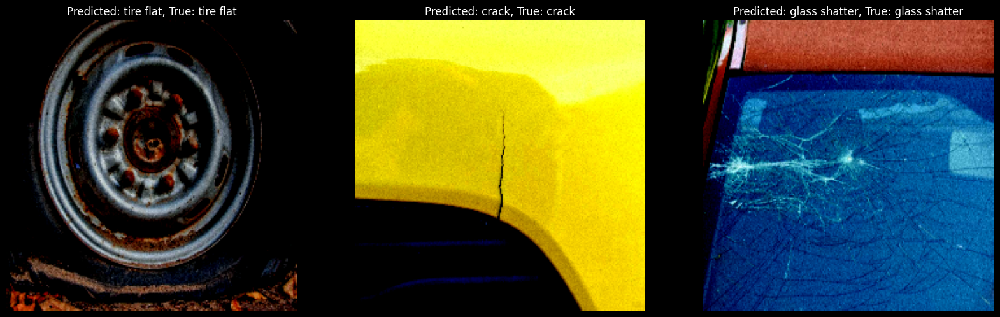

In [225]:
total_images = 600
random_indices = random.sample(range(total_images), 3)
predict_and_show_multiple(model, val_dataset_final, random_indices, label_mapping)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


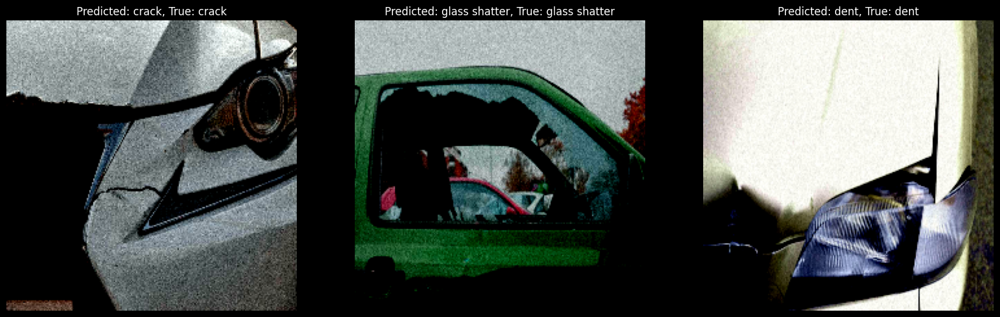

In [286]:
total_images = 400
random_indices = random.sample(range(total_images), 3)
predict_and_show_multiple(model, val_dataset_final, random_indices, label_mapping)